# Impact of Venues on Collision Occurrence in the City of Ottawa
### by Sonia Singh
### This is an analysis of Ottawa collisions to determine whether or not there is a co-relation between collision occurrence and nearby venues.  
### A co-relation would allow city planners to take these into consideration when approving and designing roads and intersections near specific types of venues.

#### Amongst published papers, there is currently minimal analysis of the potential impact of nearby venue types such as restaurants, coffee shops, bars, or stores on collision occurrences.  Given that distracted driving is considered to be a strong factor contributing to collisions, the types of venues in specific locations could be impacting driver distraction.  
#### My hypothesis is that the number of collisions at each location have a reasonable probability of being co-related to the number of types of venues at each location.  For example, the number of venues related to food, liquor, or shopping could impact driving behaviors such as individuals being distracted or being in a rush due to their visits to or from these venues.


In [121]:
# Set up the environment
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analysis

import json # library to handle JSON files
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
from pandas.plotting import parallel_coordinates

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt; plt.rcdefaults()
from matplotlib.pyplot import figure

import seaborn as sns; sns.set()

# import k-means from clustering stage
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
geolocator = Nominatim(user_agent="to_explorer")



Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.



## Load collision data set - from City of Ottawa’s open data site 

In [2]:
# Read the collision data file that has been downloaded from the Ottawa open data site
import os   
userhome = os.path.expanduser('~')
datafilepath = userhome + r'/Desktop/Coursera Course 9 - Capstone Project/2018_Tabular_Transportation_Collision_Data.xls'
print(datafilepath)
ott_collisions = pd.read_excel(datafilepath, encoding='latin-1')
ott_collisions.head(2)


/Users/soniasingh/Desktop/Coursera Course 9 - Capstone Project/2018_Tabular_Transportation_Collision_Data.xls


,ANOM_ID,DATE,YEAR,TIME,LOCATION,GEO_ID,ACCIDENT_LOCATION,CLASS_OF_ACCIDENT,IMPACT_TYPE,ENVIRONMENT,LIGHT,ROAD_SURFACE_CONDITION,TRAFFIC_CONTROL,TRAFFIC_CONTROL_CONDITION,NO_OF_PEDESTRIANS,X,Y,LONGITUDE,LATITUDE,ObjectId
0,18-14243,2018-11-24T00:00:00.000Z,2018,06:31:00,HIGHWAY 417 btwn HWY417 IC155 RAMP61 & HWY417 ...,__3ZA2Q2,01 - Non intersection,03 - P.D. only,07 - SMV other,01 - Clear,07 - Dark,01 - Dry,10 - No control,NaN,0,341711.2053,5018025.968,-76.029342,45.301217,14001
1,18-14244,2018-11-25T00:00:00.000Z,2018,03:43:00,HIGHWAY 417 btwn HWY417 IC119A RAMP75 & HWY417...,__3ZA2R2,01 - Non intersection,03 - P.D. only,04 - Sideswipe,04 - Freezing Rain,07 - Dark,02 - Wet,10 - No control,NaN,0,368942.5575,5030694.142,-75.680498,45.413243,14002


In [3]:
# Fill all NaN values in TRAFFIC_CONTROL_CONDITION column to a valid value:'00 - Unknown'
ott_collisions['TRAFFIC_CONTROL_CONDITION'].fillna('00 - Unknown', inplace=True)
ott_collisions.head(2)


,ANOM_ID,DATE,YEAR,TIME,LOCATION,GEO_ID,ACCIDENT_LOCATION,CLASS_OF_ACCIDENT,IMPACT_TYPE,ENVIRONMENT,LIGHT,ROAD_SURFACE_CONDITION,TRAFFIC_CONTROL,TRAFFIC_CONTROL_CONDITION,NO_OF_PEDESTRIANS,X,Y,LONGITUDE,LATITUDE,ObjectId
0,18-14243,2018-11-24T00:00:00.000Z,2018,06:31:00,HIGHWAY 417 btwn HWY417 IC155 RAMP61 & HWY417 ...,__3ZA2Q2,01 - Non intersection,03 - P.D. only,07 - SMV other,01 - Clear,07 - Dark,01 - Dry,10 - No control,00 - Unknown,0,341711.2053,5018025.968,-76.029342,45.301217,14001
1,18-14244,2018-11-25T00:00:00.000Z,2018,03:43:00,HIGHWAY 417 btwn HWY417 IC119A RAMP75 & HWY417...,__3ZA2R2,01 - Non intersection,03 - P.D. only,04 - Sideswipe,04 - Freezing Rain,07 - Dark,02 - Wet,10 - No control,00 - Unknown,0,368942.5575,5030694.142,-75.680498,45.413243,14002


In [123]:
# Explore how many collision locations are in the data set
print(ott_collisions['GEO_ID'].nunique())

5585


In [5]:
# Data set is too large, so we will limit our dataset to intersections that are closer to Ottawa center based on Ottawa lat/lng
# Get the lat/lng for Ottawa city center
address = 'Ottawa, ON'
location = geolocator.geocode(address, timeout=10)
ott_lat = location.latitude
ott_lng = location.longitude


In [6]:
# Create a function to be used to calculate distances in km using 2 lat/lng as input
from math import sin, cos, sqrt, atan2, radians

def distance_km(lat1, lng1, lat2, lng2):
    # approximate radius of earth in km
    R = 6373.0

    rlat1 = radians(lat1)
    rlng1 = radians(lng1)
    rlat2 = radians(lat2)
    rlng2 = radians(lng2)

    dlng = rlng2 - rlng1
    dlat = rlat2 - rlat1

    a = sin(dlat / 2)**2 + cos(rlat1) * cos(rlat2) * sin(dlng / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c

    return distance

In [7]:
# Calculate the distance between each location and Ottawa city center
ott_collisions['Distance to Ottawa'] = ott_collisions.apply(lambda x: distance_km(ott_lat, ott_lng, x['LATITUDE'], x['LONGITUDE']), axis=1)
fixed_columns = [ott_collisions.columns[-1]] + list(ott_collisions.columns[:-1])
ott_collisions = ott_collisions[fixed_columns]
ott_collisions.head(2)


,Distance to Ottawa,ANOM_ID,DATE,YEAR,TIME,LOCATION,GEO_ID,ACCIDENT_LOCATION,CLASS_OF_ACCIDENT,IMPACT_TYPE,...,LIGHT,ROAD_SURFACE_CONDITION,TRAFFIC_CONTROL,TRAFFIC_CONTROL_CONDITION,NO_OF_PEDESTRIANS,X,Y,LONGITUDE,LATITUDE,ObjectId
0,29.663323,18-14243,2018-11-24T00:00:00.000Z,2018,06:31:00,HIGHWAY 417 btwn HWY417 IC155 RAMP61 & HWY417 ...,__3ZA2Q2,01 - Non intersection,03 - P.D. only,07 - SMV other,...,07 - Dark,01 - Dry,10 - No control,00 - Unknown,0,341711.2053,5018025.968,-76.029342,45.301217,14001
1,1.162548,18-14244,2018-11-25T00:00:00.000Z,2018,03:43:00,HIGHWAY 417 btwn HWY417 IC119A RAMP75 & HWY417...,__3ZA2R2,01 - Non intersection,03 - P.D. only,04 - Sideswipe,...,07 - Dark,02 - Wet,10 - No control,00 - Unknown,0,368942.5575,5030694.142,-75.680498,45.413243,14002


## Grouping of Venue Categories into Venue Types

### Create ability to group Venue Categories as collected via FourSquare into higher level groupings of Venue Types

In [8]:
# Read in a data file that contains Venue Categories and their corresponding Venue Types
import os   
userhome = os.path.expanduser('~')
datafilepath = userhome + r'/Desktop/Coursera Course 9 - Capstone Project/Venue_Type_and_Category.xlsx'
print(datafilepath)
venue_type_category = pd.read_excel(datafilepath, encoding='latin-1')
venue_type_category.head(2)


/Users/soniasingh/Desktop/Coursera Course 9 - Capstone Project/Venue_Type_and_Category.xlsx


,Venue Category,Venue Type
0,Accessories Store,Shopping
1,Adult Boutique,Shopping


In [9]:
# Add an index to Venue Type/Category set to facilitate adding Venue Type to the nearby Venue data
venue_type_category.reset_index(inplace=True)
venue_type_category.set_index('Venue Category', inplace=True)

print(venue_type_category.shape)
print(venue_type_category['Venue Type'].unique())
print(venue_type_category['Venue Type'].nunique())

(237, 2)
['Shopping' 'Eatery' 'Transportation' 'Other' 'Entertainment'
 'Sport or Fitness' 'Auto' 'Liquor' 'Nature' 'Grocery' 'Coffee'
 'Nightlife' 'Music' 'Hotel' 'Park' 'Not Known']
16


In [10]:
# Create function to convert Venue Category to Venue Type
def get_venue_type(category):
    if category in venue_type_category.index:
        return venue_type_category.loc[category]['Venue Type']
    else:
        return 'Not Known'

## Create function to loop over multiple FourSquare calls

In [11]:
# Create a list for all venue data
all_venues_list=[]
all_venues_list

[]

In [12]:
# @hidden_cell
#Set up FourSquare credentials
CLIENT_ID = '2YN2V31JP0O45CEWN23ZYHILUR5L15KOHBFRJ2OFS43U30FU' # your Foursquare ID
CLIENT_SECRET = 'KVDFDHOFQWJ2AFXKITGUKTMAUZUCAJLK2RWP5SZI1WOS5HYD' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

#print('My credentials:')
#print('CLIENT_ID: ' + CLIENT_ID)
#print('CLIENT_SECRET:' + CLIENT_SECRET)

In [13]:
# Set up additional parameters needed for FourSquare calls
radius = 500
LIMIT = 100


In [14]:
def getNearbyVenues(loc, lat, lng, radius=500):
    
        global all_venues_list
        
        venues_list=[]
           
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        
        # comment this out if we want to use results from single call made earlier - useful for testing
        results = requests.get(url).json()
        try: 
            venues = results['response']['groups'][0]['items']

            venues_list.append([(
                loc, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name'],
                # Add Venue Type to the Venue data
                get_venue_type(v['venue']['categories'][0]['name'])) for v in venues])
            
            # Add Venue Type to the total Venue data list
            all_venues_list.extend(venues_list)
           
            # Tally up Venue Types for this collision location
            nearby_venuesdf = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
            nearby_venuesdf.columns = [
                  'GEO_ID', 
                  'Latitude', 
                  'Longitude', 
                  'Venue Name', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category',
                  'Venue Type']
            coll_venue_type = pd.DataFrame(nearby_venuesdf.groupby('Venue Type').size()).transpose()
            coll_venue_type
            
        except:  # includes simplejson.decoder.JSONDecodeError
            print('Decoding JSON has failed for ', loc)
            # Create a df to return filled with 0s
            coll_venue_type = pd.DataFrame(columns=sorted(venue_type_category['Venue Type'].unique()))
            coll_venue_type.loc[len(coll_venue_type)] = 0

        return(coll_venue_type)
    

## Analyze data and extract a suitable subset.  Then make calls to FourSquare to obtain venue data

In [15]:
# Add Venue Types as separate columns and set to 0
for item in sorted(venue_type_category['Venue Type'].unique()):
    ott_collisions[item]  = 0

### Due to FourSquare limitation on daily, hourly, burst calls, I had to break up the data into smaller sets for separate FourSquare calls

In [16]:
# FourSquare has a restriction of number of calls that can be made in a day, and hour, and in burst mode
# After encountering errors, decided to break up the dataset by distance to Ottawa, to enable selecting an appropriate subset
ott_coll_subset1 = ott_collisions.loc[(ott_collisions['Distance to Ottawa']<=0.5)]
print('<=.5 km', ott_coll_subset1.shape, ott_coll_subset1['GEO_ID'].nunique())

ott_coll_subset2 = ott_collisions.loc[(ott_collisions['Distance to Ottawa']>0.5) & (ott_collisions['Distance to Ottawa']<=.75)]
print('>.5 and <=.75 km', ott_coll_subset2.shape, ott_coll_subset2['GEO_ID'].nunique())

ott_coll_subset3 = ott_collisions.loc[(ott_collisions['Distance to Ottawa']>0.75) & (ott_collisions['Distance to Ottawa']<=1)]
print('>.75 and <=1 km', ott_coll_subset3.shape, ott_coll_subset3['GEO_ID'].nunique())

ott_coll_subset4 = ott_collisions.loc[(ott_collisions['Distance to Ottawa']>1) & (ott_collisions['Distance to Ottawa']<=1.25)]
print('>1 and <=1.25 km', ott_coll_subset4.shape, ott_coll_subset4['GEO_ID'].nunique())

ott_coll_subset5 = ott_collisions.loc[(ott_collisions['Distance to Ottawa']>1.25) & (ott_collisions['Distance to Ottawa']<=1.5)]
print('>1.25 and <=1.5 km', ott_coll_subset5.shape, ott_coll_subset5['GEO_ID'].nunique())

ott_coll_subset6 = ott_collisions.loc[(ott_collisions['Distance to Ottawa']>1.5) & (ott_collisions['Distance to Ottawa']<=2)]
print('>1.5 and <=2 km', ott_coll_subset6.shape, ott_coll_subset6['GEO_ID'].nunique())

ott_coll_subset7 = ott_collisions.loc[(ott_collisions['Distance to Ottawa']>2) & (ott_collisions['Distance to Ottawa']<=2.5)]
print('>2 and <=2.5 km', ott_coll_subset7.shape, ott_coll_subset7['GEO_ID'].nunique())

ott_coll_subset8 = ott_collisions.loc[(ott_collisions['Distance to Ottawa']>2.5) & (ott_collisions['Distance to Ottawa']<=3)]
print('>2.5 and <=3 km', ott_coll_subset8.shape, ott_coll_subset8['GEO_ID'].nunique())

ott_coll_subset = ott_collisions.loc[(ott_collisions['Distance to Ottawa']<=3)]
print('<=3 km', ott_coll_subset.shape, ott_coll_subset['GEO_ID'].nunique())


<=.5 km (236, 37) 78
>.5 and <=.75 km (251, 37) 95
>.75 and <=1 km (324, 37) 142
>1 and <=1.25 km (375, 37) 124
>1.25 and <=1.5 km (279, 37) 122
>1.5 and <=2 km (366, 37) 167
>2 and <=2.5 km (494, 37) 202
>2.5 and <=3 km (484, 37) 214
<=3 km (2809, 37) 1091


In [19]:
# Explore the first data set
print(ott_coll_subset1.shape)
print(ott_coll_subset1['GEO_ID'].nunique())
ott_coll_subset.reset_index(inplace=True)
ott_coll_subset.set_index(['ANOM_ID'], inplace=True)
ott_coll_subset.head(2)


(236, 37)
78


,index,Distance to Ottawa,DATE,YEAR,TIME,LOCATION,GEO_ID,ACCIDENT_LOCATION,CLASS_OF_ACCIDENT,IMPACT_TYPE,...,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
ANOM_ID,,,,,,,,,,,,,,,,,,,,,
18-14244,1,1.162548,2018-11-25T00:00:00.000Z,2018,03:43:00,HIGHWAY 417 btwn HWY417 IC119A RAMP75 & HWY417...,__3ZA2R2,01 - Non intersection,03 - P.D. only,04 - Sideswipe,...,0,0,0,0,0,0,0,0,0,0
18-14246,3,2.685641,2018-11-26T00:00:00.000Z,2018,06:15:00,RIVERSIDE DR @ TREMBLAY RD/HWY417 IC117 RAMP52...,10790,02 - Intersection related,03 - P.D. only,04 - Sideswipe,...,0,0,0,0,0,0,0,0,0,0


### Based on the results above, we'll select all collision locations that are within 2.5 km to Ottawa city center
### Due to FourSquare's burst mode limitation, each of these calls will be made separately

In [20]:
# For each collision location, get the nearby venues and update the number of Venue Types into collision location row
for i in ott_coll_subset1['GEO_ID'].unique():
    temp = ott_coll_subset[ott_coll_subset['GEO_ID'].isin([i])]
    coll_loc = temp.iloc[0]['GEO_ID']
    coll_lat = temp.iloc[0]['LATITUDE']
    coll_lng = temp.iloc[0]['LONGITUDE']

    ottawa_coll_venues = getNearbyVenues(coll_loc, coll_lat, coll_lng)

    for index, row in temp.iterrows():
           for j, item in enumerate(ottawa_coll_venues):
                ott_coll_subset[item].loc[index] = ottawa_coll_venues[item][0]


/Users/soniasingh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [21]:
for i in ott_coll_subset2['GEO_ID'].unique():
    temp = ott_coll_subset[ott_coll_subset['GEO_ID'].isin([i])]
    coll_loc = temp.iloc[0]['GEO_ID']
    coll_lat = temp.iloc[0]['LATITUDE']
    coll_lng = temp.iloc[0]['LONGITUDE']

# Comment out as data was already obtained earlier and stored in a file    
    ottawa_coll_venues = getNearbyVenues(coll_loc, coll_lat, coll_lng)

    for index, row in temp.iterrows():
        for j, item in enumerate(ottawa_coll_venues):
            ott_coll_subset[item].loc[index] = ottawa_coll_venues[item][0]


/Users/soniasingh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [22]:
for i in ott_coll_subset3['GEO_ID'].unique():
    temp = ott_coll_subset[ott_coll_subset['GEO_ID'].isin([i])]
    coll_loc = temp.iloc[0]['GEO_ID']
    coll_lat = temp.iloc[0]['LATITUDE']
    coll_lng = temp.iloc[0]['LONGITUDE']

# Comment out as data was already obtained earlier and stored in a file    
    ottawa_coll_venues = getNearbyVenues(coll_loc, coll_lat, coll_lng)

    for index, row in temp.iterrows():
        for j, item in enumerate(ottawa_coll_venues):
            ott_coll_subset[item].loc[index] = ottawa_coll_venues[item][0]


/Users/soniasingh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [23]:
for i in ott_coll_subset4['GEO_ID'].unique():
    temp = ott_coll_subset[ott_coll_subset['GEO_ID'].isin([i])]
    coll_loc = temp.iloc[0]['GEO_ID']
    coll_lat = temp.iloc[0]['LATITUDE']
    coll_lng = temp.iloc[0]['LONGITUDE']

# Comment out as data was already obtained earlier and stored in a file    
    ottawa_coll_venues = getNearbyVenues(coll_loc, coll_lat, coll_lng)

    for index, row in temp.iterrows():
        for j, item in enumerate(ottawa_coll_venues):
            ott_coll_subset[item].loc[index] = ottawa_coll_venues[item][0]


/Users/soniasingh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [24]:
for i in ott_coll_subset5['GEO_ID'].unique():
    temp = ott_coll_subset[ott_coll_subset['GEO_ID'].isin([i])]
    coll_loc = temp.iloc[0]['GEO_ID']
    coll_lat = temp.iloc[0]['LATITUDE']
    coll_lng = temp.iloc[0]['LONGITUDE']

# Comment out as data was already obtained earlier and stored in a file    
    ottawa_coll_venues = getNearbyVenues(coll_loc, coll_lat, coll_lng)

    for index, row in temp.iterrows():
        for j, item in enumerate(ottawa_coll_venues):
            ott_coll_subset[item].loc[index] = ottawa_coll_venues[item][0]


/Users/soniasingh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [25]:
for i in ott_coll_subset6['GEO_ID'].unique():
    temp = ott_coll_subset[ott_coll_subset['GEO_ID'].isin([i])]
    coll_loc = temp.iloc[0]['GEO_ID']
    coll_lat = temp.iloc[0]['LATITUDE']
    coll_lng = temp.iloc[0]['LONGITUDE']

# Comment out as data was already obtained earlier and stored in a file    
    ottawa_coll_venues = getNearbyVenues(coll_loc, coll_lat, coll_lng)

    for index, row in temp.iterrows():
        for j, item in enumerate(ottawa_coll_venues):
            ott_coll_subset[item].loc[index] = ottawa_coll_venues[item][0]


/Users/soniasingh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [26]:
for i in ott_coll_subset7['GEO_ID'].unique():
    temp = ott_coll_subset[ott_coll_subset['GEO_ID'].isin([i])]
    coll_loc = temp.iloc[0]['GEO_ID']
    coll_lat = temp.iloc[0]['LATITUDE']
    coll_lng = temp.iloc[0]['LONGITUDE']

# Comment out as data was already obtained earlier and stored in a file    
    ottawa_coll_venues = getNearbyVenues(coll_loc, coll_lat, coll_lng)

    for index, row in temp.iterrows():
        for j, item in enumerate(ottawa_coll_venues):
            ott_coll_subset[item].loc[index] = ottawa_coll_venues[item][0]


/Users/soniasingh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [28]:
# Explore the venue type stats
columns_to_drop = ['Distance to Ottawa', 'LONGITUDE', 'LATITUDE', 'LOCATION', 'DATE', 'YEAR', 'ACCIDENT_LOCATION', 'CLASS_OF_ACCIDENT', 'IMPACT_TYPE', 'ENVIRONMENT', \
                   'ROAD_SURFACE_CONDITION', 'TRAFFIC_CONTROL', 'TRAFFIC_CONTROL_CONDITION', 'LIGHT', 'ObjectId', 'X', 'Y']
ott_coll_subset.drop(columns_to_drop, axis=1).describe()

,index,NO_OF_PEDESTRIANS,Auto,Coffee,Eatery,Entertainment,Grocery,Hotel,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
count,2809.000000,2809.000000,2809.0,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000,2809.000000
mean,7262.982912,0.048060,0.0,2.613386,14.514418,0.914560,0.960128,1.034176,3.052332,0.379494,0.035244,0.283731,2.085084,1.584194,0.490922,3.263795,0.827341,0.232111
std,4187.285085,0.223696,0.0,3.328957,15.160016,1.470931,1.050630,1.589307,3.498235,0.894638,0.184428,0.470219,2.151050,1.637386,0.689259,4.152005,0.938504,0.561294
min,1.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3647.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7358.000000,0.000000,0.0,1.000000,9.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,2.000000,1.000000,0.000000
75%,10854.000000,0.000000,0.0,4.000000,25.000000,2.000000,2.000000,2.000000,5.000000,0.000000,0.000000,1.000000,4.000000,2.000000,1.000000,5.000000,1.000000,0.000000
max,14481.000000,2.000000,0.0,17.000000,54.000000,7.000000,4.000000,7.000000,14.000000,4.000000,1.000000,2.000000,9.000000,8.000000,3.000000,19.000000,4.000000,4.000000


In [124]:
# Map collision locations using folium and center to Ottawa's lat/lng
map_ottawa = folium.Map(location=[ott_lat, ott_lng], zoom_start=12)

# add markers to map

for lat, lng, location in zip(ott_coll_subset['LATITUDE'], ott_coll_subset['LONGITUDE'], ott_coll_subset['LOCATION']):
    label = 'Location: {}'.format(location)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_ottawa)  
    
map_ottawa

In [30]:
# Save data file so that we can reload later (if needed) without having to call FourSquare again
# Save the Collision data that includes summary of venue types
import os   
userhome = os.path.expanduser('~')
datafilepath = userhome + r'/Desktop/Coursera Course 9 - Capstone Project/Collision Data with Venue Types.csv'
print(datafilepath)
ott_coll_subset.to_csv(datafilepath, index = True)


/Users/soniasingh/Desktop/Coursera Course 9 - Capstone Project/Collision Data with Venue Types.csv


In [32]:
# Save data file so that we can reload later (if needed) without having to call FourSquare again
# Save the list of all venues for reference
import os   
userhome = os.path.expanduser('~')
datafilepath = userhome + r'/Desktop/Coursera Course 9 - Capstone Project/All Venues List.json'
print(datafilepath)
j = json.dumps(all_venues_list, indent=4)
datafile = open(datafilepath, 'w')
print(j, file=datafile)
datafile.close()


/Users/soniasingh/Desktop/Coursera Course 9 - Capstone Project/All Venues List.json


In [33]:
# Clean up the collision data file by retaining only the set that is within 2.5 km to Ottawa city center
ott_coll_for_analysis = ott_coll_subset.loc[(ott_coll_subset['Distance to Ottawa']<=2.5)]
print(ott_coll_subset.shape)
print(ott_coll_for_analysis.shape)

(2809, 37)
(2325, 37)


In [34]:
# Save data file so that we can reload later (if needed) without having to call FourSquare again
# Save the final set of Collision data that will be used for analysis and includes summary of venue types
import os   
userhome = os.path.expanduser('~')
datafilepath = userhome + r'/Desktop/Coursera Course 9 - Capstone Project/Collision Data with Venue Types - FOR ANALYSIS.csv'
print(datafilepath)
ott_coll_for_analysis.to_csv(datafilepath, index = True)


/Users/soniasingh/Desktop/Coursera Course 9 - Capstone Project/Collision Data with Venue Types - FOR ANALYSIS.csv


## Analysis via K-Means

In [35]:
# Prepare the data for application of K-Means
columns_names = ['ACCIDENT_LOCATION', 'CLASS_OF_ACCIDENT', 'IMPACT_TYPE', 'ENVIRONMENT', 
                 'LIGHT', 'ROAD_SURFACE_CONDITION', 'TRAFFIC_CONTROL',  
                 'TRAFFIC_CONTROL_CONDITION','LOCATION', 'DATE', 'TIME', 'ANOM_ID', 
                 'index', 'YEAR', 'X', 'Y', 'ObjectId']
columns_to_drop_for_analysis = columns_names

ott_coll_for_analysis.reset_index(drop=False, inplace=True)

coll_subset_kmeans = ott_coll_for_analysis.drop(columns_to_drop_for_analysis, axis=1).groupby('GEO_ID').max()

coll_subset_kmeans['Num Collisions'] = 0
coll_subset_kmeans['Num Collisions'] = ott_coll_for_analysis.groupby('GEO_ID').count()
fixed_columns = [coll_subset_kmeans.columns[-1]] + list(coll_subset_kmeans.columns[:-1])
coll_subset_kmeans = coll_subset_kmeans[fixed_columns]
coll_subset_kmeans.head()

coll_subset_kmeans['NO_OF_PEDESTRIANS'] = ott_coll_for_analysis.groupby('GEO_ID')['NO_OF_PEDESTRIANS'].sum()
coll_subset_kmeans.head()

,Num Collisions,Distance to Ottawa,NO_OF_PEDESTRIANS,LONGITUDE,LATITUDE,Auto,Coffee,Eatery,Entertainment,Grocery,...,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
GEO_ID,,,,,,,,,,,,,,,,,,,,,
1604,13,2.154283,0,-75.677765,45.438359,0,2,3,0,1,...,2,0,0,0,1,2,1,3,0,0
1679,8,1.522294,0,-75.708232,45.415741,0,0,4,0,0,...,0,0,0,0,1,2,1,0,1,2
1696,3,0.798015,0,-75.680172,45.422055,0,4,3,0,1,...,4,1,0,0,4,0,0,1,0,1
1697,9,1.172462,0,-75.689464,45.410598,0,2,16,2,1,...,5,0,0,0,4,3,0,4,2,1
1698,8,1.258724,0,-75.688783,45.409843,0,2,10,2,1,...,5,0,0,0,3,2,0,3,1,2


In [36]:
# These are columns to be excluded from K-Means calculations
cols_to_drop_for_kmeans = ['Distance to Ottawa', 'LONGITUDE', 'LATITUDE']


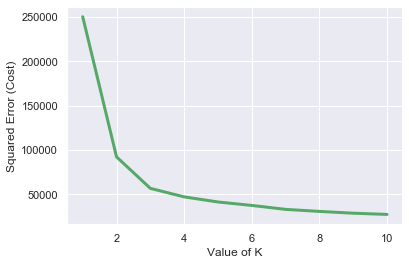

In [37]:
# To determine the ideal K value, let's compare the Squared Error(Cost) for different values of K and plot them
cost =[] 
for i in range(1, 11): 
    kmeans = KMeans(n_clusters=i, random_state=0, max_iter = 500).fit(coll_subset_kmeans.drop(cols_to_drop_for_kmeans, axis=1))
    # calculate squared error for the clustered points 
    cost.append(kmeans.inertia_)      

# plot the cost against K values 
plt.plot(range(1, 11), cost, color ='g', linewidth ='3') 
plt.xlabel("Value of K") 
plt.ylabel("Squared Error (Cost)") 
plt.show() # clear the plot 


In [38]:
# The ideal set of clusters appears to be 3, at the elbow

# Set number of clusters
kclusters = 3

# Run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(coll_subset_kmeans.drop(cols_to_drop_for_kmeans, axis=1))

# Check cluster labels generated for each row in the dataframe
kmeans.labels_[0:30] 

# Add cluster label to the data set
coll_subset_kmeans['Cluster Label'] = kmeans.labels_
fixed_columns = [coll_subset_kmeans.columns[-1]] + list(coll_subset_kmeans.columns[:-1])
coll_subset_kmeans = coll_subset_kmeans[fixed_columns]
coll_subset_kmeans.head()


,Cluster Label,Num Collisions,Distance to Ottawa,NO_OF_PEDESTRIANS,LONGITUDE,LATITUDE,Auto,Coffee,Eatery,Entertainment,...,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
GEO_ID,,,,,,,,,,,,,,,,,,,,,
1604,1,13,2.154283,0,-75.677765,45.438359,0,2,3,0,...,2,0,0,0,1,2,1,3,0,0
1679,1,8,1.522294,0,-75.708232,45.415741,0,0,4,0,...,0,0,0,0,1,2,1,0,1,2
1696,1,3,0.798015,0,-75.680172,45.422055,0,4,3,0,...,4,1,0,0,4,0,0,1,0,1
1697,0,9,1.172462,0,-75.689464,45.410598,0,2,16,2,...,5,0,0,0,4,3,0,4,2,1
1698,1,8,1.258724,0,-75.688783,45.409843,0,2,10,2,...,5,0,0,0,3,2,0,3,1,2


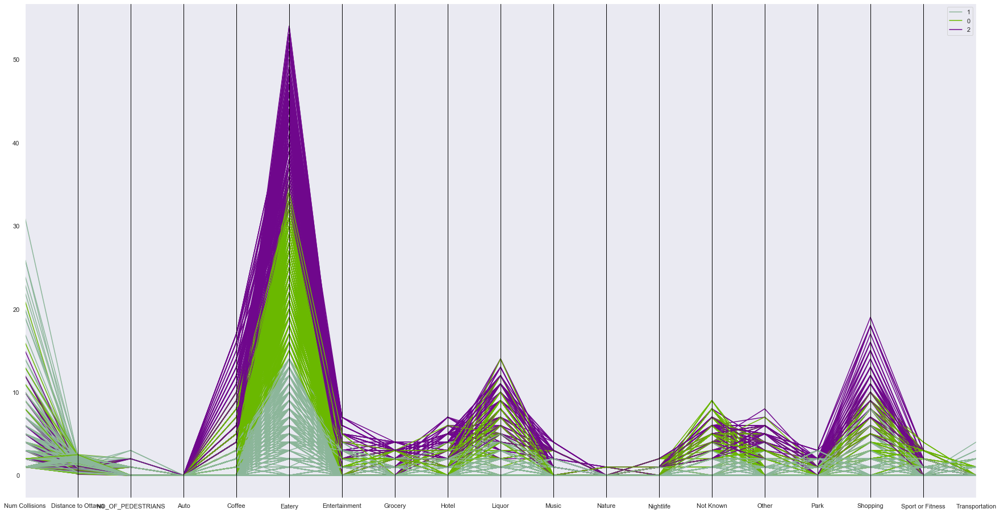

In [39]:
# Analyze the results
import pandas
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

from matplotlib.pyplot import figure
figure(figsize=(30, 16))

pd.plotting.parallel_coordinates(coll_subset_kmeans.drop(['LONGITUDE', 'LATITUDE'], axis=1), 'Cluster Label')
plt.show()


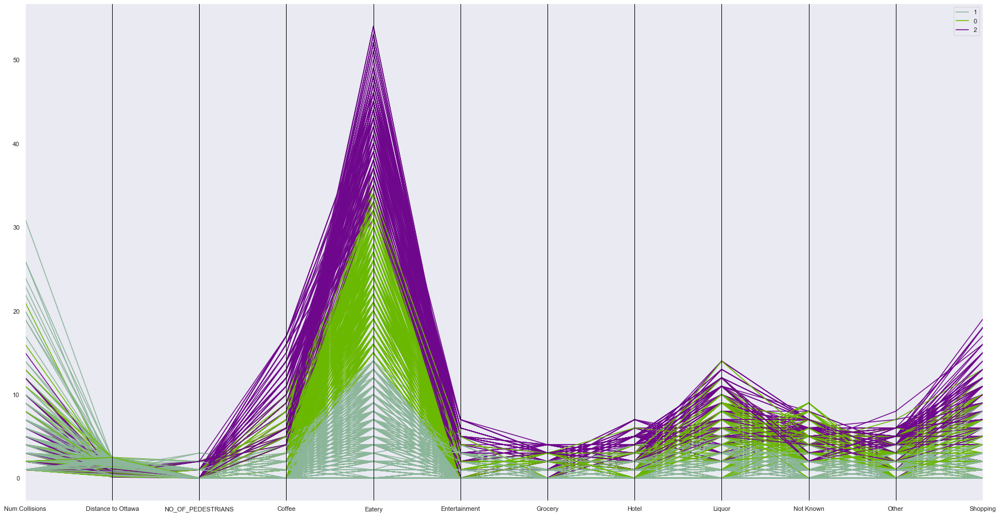

In [40]:
# Some of the venue types have minimal data, so let's try eliminating them before redoing the plot
figure(figsize=(30, 16))

pd.plotting.parallel_coordinates(coll_subset_kmeans.drop(['LONGITUDE', 'LATITUDE','Auto', 'Music', 'Nature', 'Nightlife', 'Park', 'Sport or Fitness', 'Transportation'], axis=1), 'Cluster Label')
plt.show()


### There does not appear to be a clear co-relation between the venue types and number of collisions at particular locations
### In fact, there appears to be a negative co-relation, i.e. the locations with higher number of collisions have less venues related to restaurants, bars, and shopping
### Let's try analyzing the locations that have more than 15 collisions


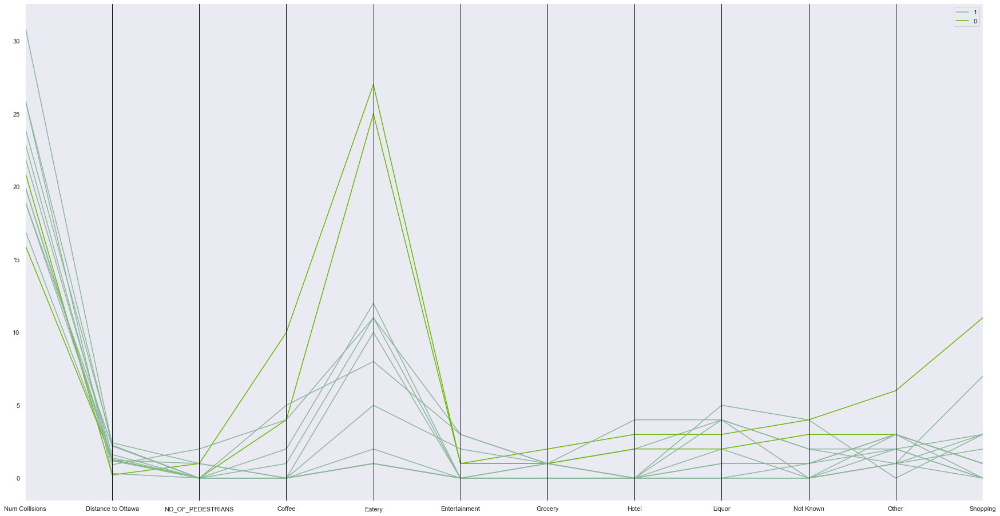

In [42]:
# There does not appear to be a clear co-relation between the venue types and number of collisions at particlar locations
# In fact, there appears to be a negative co-relation, i.e. the locations with higher number of collisions have less venues related to restaurants, bars, and shopping
# So, let's try analyzing the locations that have more than 15 collisions
figure(figsize=(30, 16))

coll_subset_kmeans_temp = coll_subset_kmeans.copy()
coll_subset_kmeans_temp = coll_subset_kmeans_temp.loc[(coll_subset_kmeans_temp['Num Collisions']>15)]

pd.plotting.parallel_coordinates(coll_subset_kmeans_temp.drop(['LONGITUDE', 'LATITUDE','Auto', 'Nature', 'Transportation', 'Park', 'Music', 'Sport or Fitness', 'Nightlife'], axis=1), 'Cluster Label')
plt.show()


### The data still shows similar results for number of collisions > 15
### Let's see what the data shows for collisions <= 10

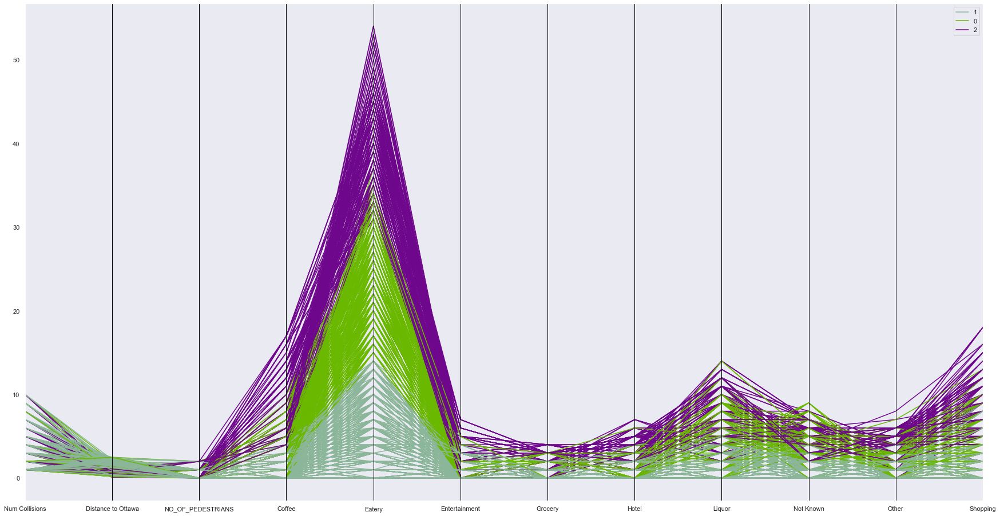

In [43]:
# The data still shows similar results for number of collisions > 15
# Let's see what the data shows for collisions <= 10
figure(figsize=(30, 16))

coll_subset_kmeans_temp = coll_subset_kmeans.copy()
coll_subset_kmeans_temp = coll_subset_kmeans_temp.loc[(coll_subset_kmeans_temp['Num Collisions']<=10)]

pd.plotting.parallel_coordinates(coll_subset_kmeans_temp.drop(['LONGITUDE', 'LATITUDE','Auto', 'Nature', 'Transportation', 'Park', 'Music', 'Sport or Fitness', 'Nightlife'], axis=1), 'Cluster Label')
plt.show()


### Let's see what the data shows for pedestrians > 1

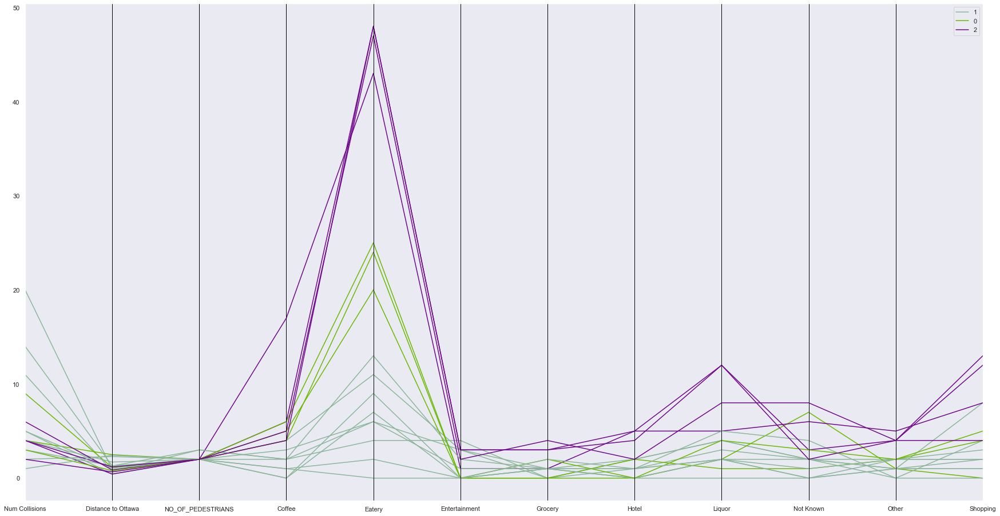

In [44]:
# Still no clear co-relation
# Let's see what the data shows for collisions where number of pedestrians involved > 1
figure(figsize=(30, 16))

coll_subset_kmeans_temp = coll_subset_kmeans.copy()
coll_subset_kmeans_temp = coll_subset_kmeans_temp.loc[(coll_subset_kmeans_temp['NO_OF_PEDESTRIANS']>1)]

pd.plotting.parallel_coordinates(coll_subset_kmeans_temp.drop(['LONGITUDE', 'LATITUDE','Auto', 'Nature', 'Transportation', 'Park', 'Music', 'Sport or Fitness', 'Nightlife'], axis=1), 'Cluster Label')
plt.show()


### There seems to be a clearer negative co-relation between the number of collisions and venue types.  i.e. the locations with higher number of collisions have less venues related to restaurants, bars, and shopping
### Let's see what the data shows for collisions where number of pedestrians involved <= 0

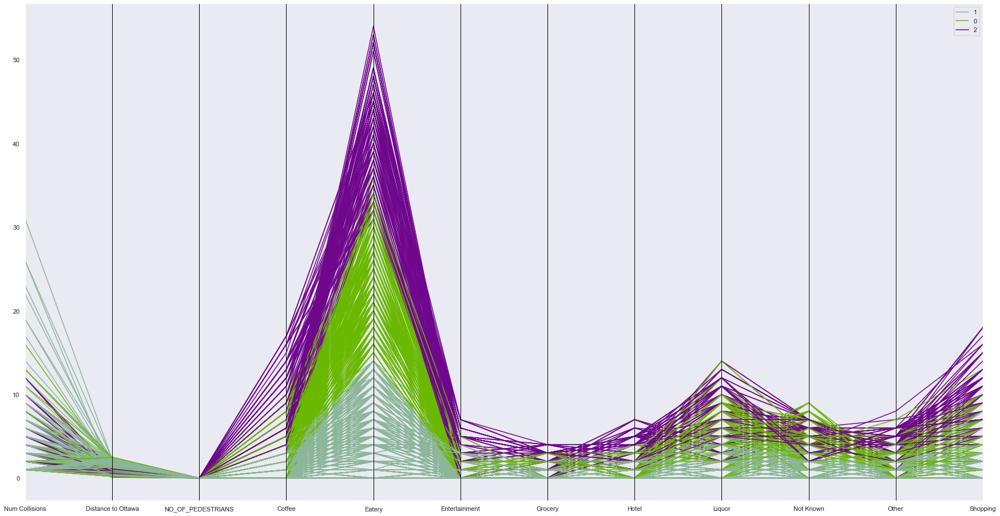

In [45]:
# There seems to be a clearer negative co-relation between the number of collisions and venue types
#   i.e. the locations with higher number of collisions have less venues related to restaurants, bars, and shopping
# Let's see what the data shows for collisions where number of pedestrians involved <= 0

figure(figsize=(30, 16))

coll_subset_kmeans_temp = coll_subset_kmeans.copy()
coll_subset_kmeans_temp = coll_subset_kmeans_temp.loc[(coll_subset_kmeans_temp['NO_OF_PEDESTRIANS']<=0)]

pd.plotting.parallel_coordinates(coll_subset_kmeans_temp.drop(['LONGITUDE', 'LATITUDE','Auto', 'Nature', 'Transportation', 'Park', 'Music', 'Sport or Fitness', 'Nightlife'], axis=1), 'Cluster Label')
plt.show()


### Still showing similar results.  Let's try analyzing using pair plots, see if we can find any other co-relation

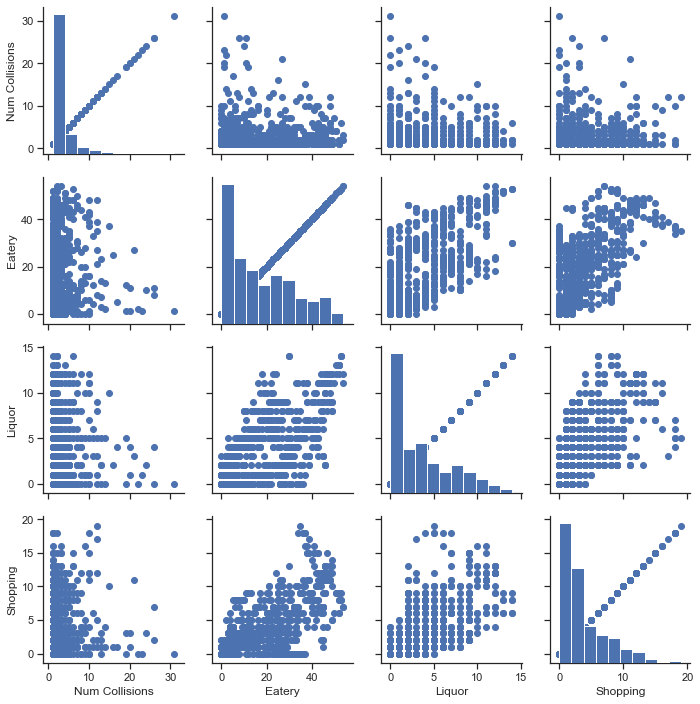

In [46]:
sns.set(style="ticks")

g = sns.pairplot(coll_subset_kmeans[['Num Collisions', 'Eatery', 'Liquor', 'Shopping']])
g = g.map(plt.scatter)

### No new insights using pair plots.  Let's see what a scatter plot and a box plot shows

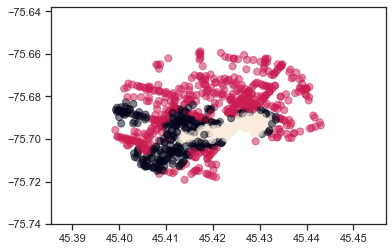

In [47]:
plt.scatter(coll_subset_kmeans['LATITUDE'], coll_subset_kmeans['LONGITUDE'], c= kmeans.labels_.astype(float), s=50, alpha=0.5)


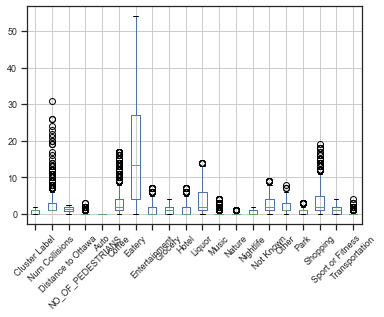

In [48]:
boxplot = coll_subset_kmeans.drop(['LONGITUDE', 'LATITUDE'], axis=1).boxplot(rot=45, fontsize=9)
boxplot


### Let's examine a heat map to determine co-relation between number of collisions and eateries

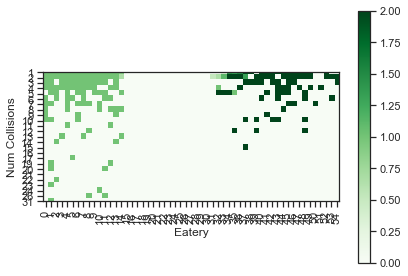

In [50]:
piv = pd.pivot_table(coll_subset_kmeans, values="Cluster Label",index=["Num Collisions"], columns=["Eatery"], fill_value=0)

fig, ax = plt.subplots()
im = ax.imshow(piv, cmap="Greens")
fig.colorbar(im, ax=ax)

ax.set_xticks(range(len(piv.columns)))
ax.set_yticks(range(len(piv.index)))
ax.set_xticklabels(piv.columns, rotation=90)
ax.set_yticklabels(piv.index)
ax.set_xlabel("Eatery")
ax.set_ylabel("Num Collisions")

plt.tight_layout()
plt.show()

### Let's examine a heat map to determine co-relation between number of collisions and liquor places

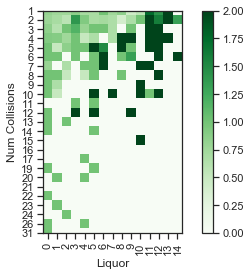

In [51]:
piv = pd.pivot_table(coll_subset_kmeans, values="Cluster Label",index=["Num Collisions"], columns=["Liquor"], fill_value=0)

fig, ax = plt.subplots()
im = ax.imshow(piv, cmap="Greens")
fig.colorbar(im, ax=ax)

ax.set_xticks(range(len(piv.columns)))
ax.set_yticks(range(len(piv.index)))
ax.set_xticklabels(piv.columns, rotation=90)
ax.set_yticklabels(piv.index)
ax.set_xlabel("Liquor")
ax.set_ylabel("Num Collisions")

plt.tight_layout()
plt.show()

### Let's examine a heat map to determine co-relation between number of collisions and shopping places

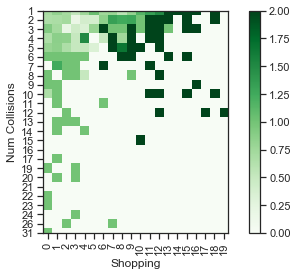

In [52]:
piv = pd.pivot_table(coll_subset_kmeans, values="Cluster Label",index=["Num Collisions"], columns=["Shopping"], fill_value=0)

fig, ax = plt.subplots()
im = ax.imshow(piv, cmap="Greens")
fig.colorbar(im, ax=ax)

ax.set_xticks(range(len(piv.columns)))
ax.set_yticks(range(len(piv.index)))
ax.set_xticklabels(piv.columns, rotation=90)
ax.set_yticklabels(piv.index)
ax.set_xlabel("Shopping")
ax.set_ylabel("Num Collisions")

plt.tight_layout()
plt.show()

### Let's examine a heat map to determine co-relation between number of collisions and coffee places

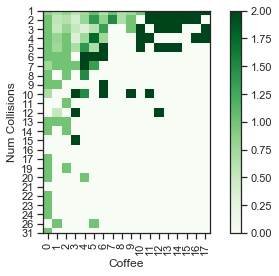

In [53]:
piv = pd.pivot_table(coll_subset_kmeans, values="Cluster Label",index=["Num Collisions"], columns=["Coffee"], fill_value=0)

fig, ax = plt.subplots()
im = ax.imshow(piv, cmap="Greens")
fig.colorbar(im, ax=ax)

ax.set_xticks(range(len(piv.columns)))
ax.set_yticks(range(len(piv.index)))
ax.set_xticklabels(piv.columns, rotation=90)
ax.set_yticklabels(piv.index)
ax.set_xlabel("Coffee")
ax.set_ylabel("Num Collisions")

plt.tight_layout()
plt.show()

## The 3 K-Means clusters seem to be grouped as follows:
### •	Cluster 0: Medium number of Coffee and Eatery type of venues
### •	Cluster 1: Low number of Coffee and Eatery type of venues
### •	Cluster 2: High number of Coffee and Eatery type of venues


In [59]:
coll_subset_kmeans.loc[coll_subset_kmeans['Cluster Label'] == 0, coll_subset_kmeans.columns[[1]+[3]+ list(range(6, coll_subset_kmeans.shape[1]))]]


,Num Collisions,NO_OF_PEDESTRIANS,Auto,Coffee,Eatery,Entertainment,Grocery,Hotel,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
GEO_ID,,,,,,,,,,,,,,,,,,
1697,9,0,0,2,16,2,1,1,5,0,0,0,4,3,0,4,2,1
2039,8,0,0,8,20,0,0,4,2,0,1,1,4,2,1,6,2,0
2110,7,0,0,0,28,0,2,0,0,0,0,0,2,2,0,0,1,0
2114,7,0,0,7,30,0,0,4,2,0,0,1,3,2,1,9,2,0
2162,10,0,0,0,16,0,1,0,1,0,0,0,3,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
__3ZBORG,1,0,0,5,23,0,2,0,6,0,1,1,5,0,1,4,3,0
__3ZBOXJ,1,0,0,3,33,3,0,0,7,1,0,1,2,3,0,3,2,0
__3ZBOXN,1,0,0,3,34,5,0,0,7,1,0,1,2,3,0,3,2,0


In [60]:
coll_subset_kmeans.loc[coll_subset_kmeans['Cluster Label'] == 1, coll_subset_kmeans.columns[[1]+[3]+ list(range(6, coll_subset_kmeans.shape[1]))]]


,Num Collisions,NO_OF_PEDESTRIANS,Auto,Coffee,Eatery,Entertainment,Grocery,Hotel,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
GEO_ID,,,,,,,,,,,,,,,,,,
1604,13,0,0,2,3,0,1,0,2,0,0,0,1,2,1,3,0,0
1679,8,0,0,0,4,0,0,1,0,0,0,0,1,2,1,0,1,2
1696,3,0,0,4,3,0,1,0,4,1,0,0,4,0,0,1,0,1
1698,8,0,0,2,10,2,1,1,5,0,0,0,3,2,0,3,1,2
2020,5,2,0,2,6,3,0,2,4,0,0,0,2,1,0,8,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
__7TR60M,2,0,0,1,2,0,0,0,0,0,0,0,0,0,2,0,0,0
__7TTQA0,2,0,0,1,1,0,0,0,0,0,0,0,0,0,2,0,0,0
__7TTREF,1,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0


In [61]:
coll_subset_kmeans.loc[coll_subset_kmeans['Cluster Label'] == 2, coll_subset_kmeans.columns[[1]+[3]+ list(range(6, coll_subset_kmeans.shape[1]))]]


,Num Collisions,NO_OF_PEDESTRIANS,Auto,Coffee,Eatery,Entertainment,Grocery,Hotel,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
GEO_ID,,,,,,,,,,,,,,,,,,
2109,6,0,0,4,43,7,3,3,9,4,0,1,4,4,2,15,1,0
2113,12,1,0,12,35,3,1,7,5,3,0,0,2,5,3,19,3,0
2115,3,0,0,12,39,0,0,4,2,0,0,1,5,3,1,11,2,0
2116,1,1,0,17,46,1,1,5,2,3,0,1,7,4,2,9,2,0
2117,2,0,0,15,45,3,2,6,3,3,0,0,6,5,2,7,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
__3ZBOX5,1,0,0,6,45,6,3,4,11,1,0,1,2,6,1,12,2,0
__3ZBOX6,2,0,0,6,44,7,3,4,11,2,0,1,2,6,1,12,1,0
__3ZBOX9,2,2,0,4,48,3,3,5,12,1,0,1,2,4,0,12,1,0


### Since none of these visualizations show any co-relation to the original hypothesis, I decided to switch gears and try a different approach as described in the next section.  

## Apply a different approach:
### Conduct an analysis of collision locations in proximity to a Tim Hortons where anectodal observations have been made relative to increased distracted driver behaviour.  This Tim Horton's is located at 2145 Robertson Rd, Nepean, ON K2H 5Z2.


In [62]:
print(ott_collisions['GEO_ID'].nunique())


5585


In [63]:
# Select a specific Tim Horton's in an area where distracter behaviour has been observed at 2145 Robertson Rd, Nepean, ON K2H 5Z2
tm_lat = 45.320859
tm_lng = -75.836647

tm_collisions = ott_collisions.copy()
tm_collisions['Distance to TH'] = tm_collisions.apply(lambda x: distance_km(tm_lat, tm_lng, x['LATITUDE'], x['LONGITUDE']), axis=1)
fixed_columns = [tm_collisions.columns[-1]] + list(tm_collisions.columns[:-1])
tm_collisions = tm_collisions[fixed_columns]
tm_collisions.head(2)

tm_coll_subset1 = tm_collisions.loc[(tm_collisions['Distance to TH']<=4)]
print('<=4 km', tm_coll_subset1.shape, tm_coll_subset1['GEO_ID'].nunique())


<=4 km (620, 38) 215


In [64]:
print(tm_coll_subset1.shape)
print(tm_coll_subset1['GEO_ID'].nunique())

tm_coll_subset1.head(2)

(620, 38)
215


,Distance to TH,Distance to Ottawa,ANOM_ID,DATE,YEAR,TIME,LOCATION,GEO_ID,ACCIDENT_LOCATION,CLASS_OF_ACCIDENT,...,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
10,2.677358,13.481309,18-14122,2018-11-07T00:00:00.000Z,2018,07:15:00,HIGHWAY 417 btwn HWY417 IC131 RAMP53 & HWY417 ...,__3ZA1MU,01 - Non intersection,03 - P.D. only,...,0,0,0,0,0,0,0,0,0,0
14,3.138382,15.011682,18-14255,2018-11-27T00:00:00.000Z,2018,08:33:00,HIGHWAY 416 btwn HWY416 IC72 RAMP63 & HWY416 I...,__3ZA1NF,01 - Non intersection,02 - Non-fatal injury,...,0,0,0,0,0,0,0,0,0,0


In [125]:
# Let's explore the area on a map
tm_lat = 45.320859
tm_lng = -75.836647

# Map using folium and center to the locations's lat/lng
map_tm = folium.Map(location=[tm_lat, tm_lng], zoom_start=12)

# add markers to map

for lat, lng, location in zip(tm_coll_subset1['LATITUDE'], tm_coll_subset1['LONGITUDE'], tm_coll_subset1['LOCATION']):
    label = 'Location: {}'.format(location)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_tm)  
    
map_tm


In [67]:
# Rewrite a customized getNearbyVenues function
def tm_getNearbyVenues(loc, lat, lng, radius=500):
    
        global tm_venues_list
        
        venues_list=[]
           
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        
        # comment this out if we want to use results from single call made earlier - useful for testing
        results = requests.get(url).json()
        try: 
            venues = results['response']['groups'][0]['items']

            venues_list.append([(
                loc, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name'],
                # Add Venue Type to the Venue data
                get_venue_type(v['venue']['categories'][0]['name'])) for v in venues])
             
            tm_venues_list.extend(venues_list)
           
            # Tally up Venue Types for this collision location
            nearby_venuesdf = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
            nearby_venuesdf.columns = [
                  'GEO_ID', 
                  'Latitude', 
                  'Longitude', 
                  'Venue Name', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category',
                  'Venue Type']
            coll_venue_type = pd.DataFrame(nearby_venuesdf.groupby('Venue Type').size()).transpose()
            coll_venue_type
            
        except:  # includes simplejson.decoder.JSONDecodeError
            print('Decoding JSON has failed for ', loc)
            # Create a dummy venue type row for testing purposes
            coll_venue_type = pd.DataFrame(columns=sorted(venue_type_category['Venue Type'].unique()))
            coll_venue_type.loc[len(coll_venue_type)] = 0

        return(coll_venue_type)
    

In [69]:
# For each collision location, get the nearby venues and update the number of Venue Types into collision location row
tm_venues_list=[]
tm_venues_list

radius = 500
LIMIT = 100

for i in tm_coll_subset1['GEO_ID'].unique():
    temp = tm_coll_subset1[tm_coll_subset1['GEO_ID'].isin([i])]

    coll_loc = temp.iloc[0]['GEO_ID']
    coll_lat = temp.iloc[0]['LATITUDE']
    coll_lng = temp.iloc[0]['LONGITUDE']
#    print(coll_loc, coll_lat, coll_lng)

    tm_coll_venues = tm_getNearbyVenues(coll_loc, coll_lat, coll_lng)

    for index, row in temp.iterrows():
        for j, item in enumerate(tm_coll_venues):
            tm_coll_subset1[item].loc[index] = tm_coll_venues[item][0]


/Users/soniasingh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Decoding JSON has failed for  __3ZA4YJ
Decoding JSON has failed for  __3ZAZM6
Decoding JSON has failed for  __3ZAZCZ
Decoding JSON has failed for  __3ZA4Z7B
Decoding JSON has failed for  __4LVKHQ
Decoding JSON has failed for  860
Decoding JSON has failed for  11882


In [70]:
tm_nearby_venuesdf = pd.DataFrame([item for venue_list in tm_venues_list for item in venue_list])
tm_nearby_venuesdf.columns = [
    'GEO_ID', 
    'Latitude', 
    'Longitude', 
    'Venue Name', 
    'Venue Latitude', 
    'Venue Longitude', 
    'Venue Category',
    'Venue Type']
 

In [71]:
print(tm_nearby_venuesdf.shape)
tm_nearby_venuesdf.head()

(1401, 8)


,GEO_ID,Latitude,Longitude,Venue Name,Venue Latitude,Venue Longitude,Venue Category,Venue Type
0,__3ZA1MU,45.342499,-75.821654,La Senza,45.341557,-75.819206,Lingerie Store,Shopping
1,__3ZA1MU,45.342499,-75.821654,Lakeview Park,45.345701,-75.821214,Park,Park
2,__3ZA1MU,45.342499,-75.821654,416/417 Split,45.342484,-75.815890,Intersection,Other
3,__3ZA1NF,45.310097,-75.799556,416/417 Split,45.312704,-75.801116,Intersection,Other
4,__3ZAZET,45.337208,-75.843906,OC Transpo Stop 6480,45.336324,-75.841089,Bus Stop,Transportation


In [72]:
tm_coll_subset1

,Distance to TH,Distance to Ottawa,ANOM_ID,DATE,YEAR,TIME,LOCATION,GEO_ID,ACCIDENT_LOCATION,CLASS_OF_ACCIDENT,...,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
10,2.677358,13.481309,18-14122,2018-11-07T00:00:00.000Z,2018,07:15:00,HIGHWAY 417 btwn HWY417 IC131 RAMP53 & HWY417 ...,__3ZA1MU,01 - Non intersection,03 - P.D. only,...,0,0,0,0,0,1,1,1,0,0
14,3.138382,15.011682,18-14255,2018-11-27T00:00:00.000Z,2018,08:33:00,HIGHWAY 416 btwn HWY416 IC72 RAMP63 & HWY416 I...,__3ZA1NF,01 - Non intersection,02 - Non-fatal injury,...,0,0,0,0,0,1,0,0,0,0
21,1.905032,15.201878,18-14262,2018-11-29T00:00:00.000Z,2018,07:45:00,HIGHWAY 417 btwn HWY417 IC134 RAMP51 & HWY417 ...,__3ZAZET,01 - Non intersection,03 - P.D. only,...,0,0,0,0,0,0,0,0,0,2
50,2.186012,14.409344,18-14291,2018-12-04T00:00:00.000Z,2018,07:30:00,HIGHWAY 417 btwn HWY417 IC134 RAMP25 & HWY417 ...,__3ZA2LE,01 - Non intersection,03 - P.D. only,...,0,0,0,0,0,0,0,0,0,1
53,2.529886,15.350745,18-14294,2018-12-04T00:00:00.000Z,2018,17:15:00,WEST HUNT CLUB RD btwn MOODIE DR & HWY416 IC72...,__3ZA4YJ,01 - Non intersection,03 - P.D. only,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14429,2.190923,17.346917,18-12346,2018-12-21T00:00:00.000Z,2018,21:31:00,RICHMOND RD @ WEST HUNT CLUB RD (0000598),598,02 - Intersection related,03 - P.D. only,...,0,0,0,0,0,0,0,0,1,0
14465,1.772913,14.256390,18-12382,2018-12-22T00:00:00.000Z,2018,16:05:00,RICHMOND RD @ NORTHSIDE RD E (0010417),10417,02 - Intersection related,03 - P.D. only,...,2,0,0,0,0,2,0,5,0,0
14469,2.491169,14.716586,18-12386,2018-12-22T00:00:00.000Z,2018,21:03:00,MOODIE DR @ CORKSTOWN RD (0000577),577,03 - At intersection,03 - P.D. only,...,0,0,0,0,0,1,0,0,0,2
14471,2.295180,14.854939,18-12388,2018-12-22T00:00:00.000Z,2018,22:54:00,CORKSTOWN RD btwn MARCH RD & MOODIE DR (__3ZA2LR),__3ZA2LR,01 - Non intersection,03 - P.D. only,...,0,0,0,0,2,0,0,0,0,1


In [73]:
tm_nearby_venuesdf[tm_nearby_venuesdf['Venue Name'].isin(['Tim Hortons'])].shape


(48, 8)

In [74]:
tm_nearby_venuesdf.head()

,GEO_ID,Latitude,Longitude,Venue Name,Venue Latitude,Venue Longitude,Venue Category,Venue Type
0,__3ZA1MU,45.342499,-75.821654,La Senza,45.341557,-75.819206,Lingerie Store,Shopping
1,__3ZA1MU,45.342499,-75.821654,Lakeview Park,45.345701,-75.821214,Park,Park
2,__3ZA1MU,45.342499,-75.821654,416/417 Split,45.342484,-75.815890,Intersection,Other
3,__3ZA1NF,45.310097,-75.799556,416/417 Split,45.312704,-75.801116,Intersection,Other
4,__3ZAZET,45.337208,-75.843906,OC Transpo Stop 6480,45.336324,-75.841089,Bus Stop,Transportation


In [75]:
tm_df = pd.DataFrame(tm_nearby_venuesdf[tm_nearby_venuesdf['Venue Name'].isin(['Tim Hortons'])])


In [76]:
# Let's check how many collision locations have a Tim Horton's nearby
# Note that the same Tim Horton's could be near multiple collision locations
tm_df.head(48)

,GEO_ID,Latitude,Longitude,Venue Name,Venue Latitude,Venue Longitude,Venue Category,Venue Type
68,__3ZA298,45.345403,-75.805683,Tim Hortons,45.348077,-75.804677,Coffee Shop,Coffee
95,__3ZA2UV,45.345873,-75.801819,Tim Hortons,45.348077,-75.804677,Coffee Shop,Coffee
126,__3ZAY7M,45.346503,-75.802488,Tim Hortons,45.348077,-75.804677,Coffee Shop,Coffee
162,__3ZA29A,45.345216,-75.809271,Tim Hortons,45.348077,-75.804677,Coffee Shop,Coffee
172,__3ZBOCP,45.353897,-75.847811,Tim Hortons,45.351391,-75.851820,Coffee Shop,Coffee
186,1130,45.326299,-75.822953,Tim Hortons,45.327451,-75.821176,Coffee Shop,Coffee
208,10545,45.322107,-75.833300,Tim Hortons,45.320964,-75.836716,Coffee Shop,Coffee
233,155,45.327701,-75.819571,Tim Hortons,45.327451,-75.821176,Coffee Shop,Coffee
297,__3ZBOCU,45.327062,-75.821116,Tim Hortons,45.327451,-75.821176,Coffee Shop,Coffee
327,5301,45.320629,-75.836850,Tim Hortons,45.320964,-75.836716,Coffee Shop,Coffee


In [126]:
# Let's see what that looks like on a map
tm_lat = 45.320859
tm_lng = -75.836647

# Map using folium and center to Ottawa's lat/lng
map_tm = folium.Map(location=[tm_lat, tm_lng], zoom_start=12)

# add markers to map

for lat, lng, location in zip(tm_coll_subset1['LATITUDE'], tm_coll_subset1['LONGITUDE'], tm_coll_subset1['LOCATION']):
    label = 'Location: {}'.format(location)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_tm)  
    
for lat, lng, location in zip(tm_df['Venue Latitude'], tm_df['Venue Longitude'], tm_df['GEO_ID']):
    label = 'Location: {}'.format(location)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_tm)  
    
    
map_tm


In [78]:
# Save data files so that we can reload later (if needed) without having to call FourSquare again
# Save the Collision data that includes summary of venue types
import os   
userhome = os.path.expanduser('~')
datafilepath = userhome + r'/Desktop/Coursera Course 9 - Capstone Project/TH - Collision Data with Venue Types.csv'
print(datafilepath)
tm_coll_subset1.to_csv(datafilepath, index = True)

# Save the list of all venues for reference
import os   
userhome = os.path.expanduser('~')
datafilepath = userhome + r'/Desktop/Coursera Course 9 - Capstone Project/TH - All Venues List.json'
print(datafilepath)
j = json.dumps(tm_venues_list, indent=4)
datafile = open(datafilepath, 'w')
print(j, file=datafile)
datafile.close()

# Save the Tim Hortons locations
import os   
userhome = os.path.expanduser('~')
datafilepath = userhome + r'/Desktop/Coursera Course 9 - Capstone Project/TH - Tim Hortons Locations.csv'
print(datafilepath)
tm_df.to_csv(datafilepath, index = True)



/Users/soniasingh/Desktop/Coursera Course 9 - Capstone Project/TH - Collision Data with Venue Types.csv
/Users/soniasingh/Desktop/Coursera Course 9 - Capstone Project/TH - All Venues List.json
/Users/soniasingh/Desktop/Coursera Course 9 - Capstone Project/TH - Tim Hortons Locations.csv


## Analyze using K-means

In [79]:
coll_for_analysis = tm_coll_subset1.copy()

In [80]:
coll_for_analysis['TH Nearby'] = "0"

In [81]:
coll_for_analysis
fixed_columns = [coll_for_analysis.columns[-1]] + list(coll_for_analysis.columns[:-1])
coll_for_analysis = coll_for_analysis[fixed_columns]
coll_for_analysis.head(2)


,TH Nearby,Distance to TH,Distance to Ottawa,ANOM_ID,DATE,YEAR,TIME,LOCATION,GEO_ID,ACCIDENT_LOCATION,...,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
10,0,2.677358,13.481309,18-14122,2018-11-07T00:00:00.000Z,2018,07:15:00,HIGHWAY 417 btwn HWY417 IC131 RAMP53 & HWY417 ...,__3ZA1MU,01 - Non intersection,...,0,0,0,0,0,1,1,1,0,0
14,0,3.138382,15.011682,18-14255,2018-11-27T00:00:00.000Z,2018,08:33:00,HIGHWAY 416 btwn HWY416 IC72 RAMP63 & HWY416 I...,__3ZA1NF,01 - Non intersection,...,0,0,0,0,0,1,0,0,0,0


In [82]:
tm_df['GEO_ID'].isin(['__3ZA298']).any()

True

In [83]:
coll_for_analysis['TH Nearby'] = coll_for_analysis.apply(lambda x: 1 if (tm_df['GEO_ID'].isin([x['GEO_ID']]).any()==True) else 0, axis=1)


In [84]:
coll_for_analysis['TH Nearby'].value_counts()

0    473
1    147
Name: TH Nearby, dtype: int64

In [85]:
columns_names = ['ACCIDENT_LOCATION', 'CLASS_OF_ACCIDENT', 'IMPACT_TYPE', 'ENVIRONMENT', 
                 'LIGHT', 'ROAD_SURFACE_CONDITION', 'TRAFFIC_CONTROL',  
                 'TRAFFIC_CONTROL_CONDITION','LOCATION', 'DATE', 'TIME', 'ANOM_ID', 
                 'index', 'YEAR', 'X', 'Y', 'ObjectId']
columns_to_drop_for_analysis = columns_names

coll_for_analysis.reset_index(drop=False, inplace=True)

coll_subset_kmeans = coll_for_analysis.drop(columns_to_drop_for_analysis, axis=1).groupby('GEO_ID').max()

coll_subset_kmeans['Num Collisions'] = 0
coll_subset_kmeans['Num Collisions'] = coll_for_analysis.groupby('GEO_ID').count()
fixed_columns = [coll_subset_kmeans.columns[-1]] + list(coll_subset_kmeans.columns[:-1])
coll_subset_kmeans = coll_subset_kmeans[fixed_columns]
coll_subset_kmeans.head()

coll_subset_kmeans['NO_OF_PEDESTRIANS'] = coll_for_analysis.groupby('GEO_ID')['NO_OF_PEDESTRIANS'].sum()
coll_subset_kmeans.head()


,Num Collisions,TH Nearby,Distance to TH,Distance to Ottawa,NO_OF_PEDESTRIANS,LONGITUDE,LATITUDE,Auto,Coffee,Eatery,...,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
GEO_ID,,,,,,,,,,,,,,,,,,,,,
11,2,0,2.902364,13.177779,0,-75.804530,45.333936,0,0,1,...,0,0,0,0,0,0,0,2,0,1
148,7,0,2.368048,13.615368,0,-75.813137,45.334277,0,0,1,...,0,0,0,0,0,0,0,0,0,0
155,10,1,1.537144,14.489808,0,-75.819570,45.327713,0,2,6,...,2,0,0,0,0,2,0,5,0,0
158,4,1,3.713375,14.333399,0,-75.846522,45.353514,0,2,0,...,0,0,0,0,0,0,0,0,0,0
512,1,0,3.427221,13.446762,0,-75.830954,45.351410,0,0,2,...,0,0,0,0,0,0,1,0,0,1


In [86]:
cols_to_drop_for_kmeans = ['Distance to TH', 'Distance to Ottawa', 'NO_OF_PEDESTRIANS']


In [87]:
venue_cols_to_drop_for_kmeans = (venue_type_category['Venue Type'].unique().tolist())
venue_cols_to_drop_for_kmeans = [e for e in venue_cols_to_drop_for_kmeans if e not in {'Coffee', 'Eatery'}]

In [88]:
venue_cols_to_drop_for_kmeans

['Shopping',
 'Transportation',
 'Other',
 'Entertainment',
 'Sport or Fitness',
 'Auto',
 'Liquor',
 'Nature',
 'Grocery',
 'Nightlife',
 'Music',
 'Hotel',
 'Park',
 'Not Known']

In [89]:
cols_to_drop_for_kmeans.extend(venue_cols_to_drop_for_kmeans)

In [90]:
cols_to_drop_for_kmeans

['Distance to TH',
 'Distance to Ottawa',
 'NO_OF_PEDESTRIANS',
 'Shopping',
 'Transportation',
 'Other',
 'Entertainment',
 'Sport or Fitness',
 'Auto',
 'Liquor',
 'Nature',
 'Grocery',
 'Nightlife',
 'Music',
 'Hotel',
 'Park',
 'Not Known']

In [91]:
df_for_kmeans = coll_subset_kmeans.drop(cols_to_drop_for_kmeans, axis=1)
df_for_kmeans


,Num Collisions,TH Nearby,LONGITUDE,LATITUDE,Coffee,Eatery
GEO_ID,,,,,,
11,2,0,-75.804530,45.333936,0,1
148,7,0,-75.813137,45.334277,0,1
155,10,1,-75.819570,45.327713,2,6
158,4,1,-75.846522,45.353514,2,0
512,1,0,-75.830954,45.351410,0,2
...,...,...,...,...,...,...
__4LVKHQ,1,0,-75.846866,45.286538,0,0
__6KE4J1A,1,0,-75.809907,45.351417,1,6
__6KE4J1B,1,0,-75.812762,45.346895,2,6


In [92]:
cols_to_drop_for_kmeans.extend({'LONGITUDE', 'LATITUDE'})

In [93]:
coll_subset_kmeans.drop(cols_to_drop_for_kmeans, axis=1)

,Num Collisions,TH Nearby,Coffee,Eatery
GEO_ID,,,,
11,2,0,0,1
148,7,0,0,1
155,10,1,2,6
158,4,1,2,0
512,1,0,0,2
...,...,...,...,...
__4LVKHQ,1,0,0,0
__6KE4J1A,1,0,1,6
__6KE4J1B,1,0,2,6


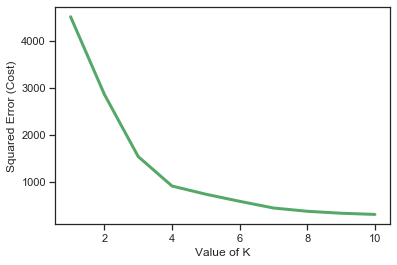

In [94]:
# Let's compare the squared error(Cost) for different values of K, and plot it

cost =[] 
for i in range(1, 11):     
    kmeans = KMeans(n_clusters=i, random_state=0, max_iter = 500).fit(coll_subset_kmeans.drop(cols_to_drop_for_kmeans, axis=1))
     
    # calculates squared error for the clustered points 
    cost.append(kmeans.inertia_)      
  
# plot the cost against K values 
plt.plot(range(1, 11), cost, color ='g', linewidth ='3') 
plt.xlabel("Value of K") 
plt.ylabel("Squared Error (Cost)") 
plt.show() 

In [95]:
# The ideal set of clusters appears to be 4, at the elbow

# set number of clusters
kclusters = 4

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(coll_subset_kmeans.drop(cols_to_drop_for_kmeans, axis=1))

#print(centroids)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:30] 

coll_subset_kmeans['Cluster Label'] = kmeans.labels_
fixed_columns = [coll_subset_kmeans.columns[-1]] + list(coll_subset_kmeans.columns[:-1])
coll_subset_kmeans = coll_subset_kmeans[fixed_columns]
coll_subset_kmeans.head()


,Cluster Label,Num Collisions,TH Nearby,Distance to TH,Distance to Ottawa,NO_OF_PEDESTRIANS,LONGITUDE,LATITUDE,Auto,Coffee,...,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
GEO_ID,,,,,,,,,,,,,,,,,,,,,
11,2,2,0,2.902364,13.177779,0,-75.804530,45.333936,0,0,...,0,0,0,0,0,0,0,2,0,1
148,0,7,0,2.368048,13.615368,0,-75.813137,45.334277,0,0,...,0,0,0,0,0,0,0,0,0,0
155,0,10,1,1.537144,14.489808,0,-75.819570,45.327713,0,2,...,2,0,0,0,0,2,0,5,0,0
158,2,4,1,3.713375,14.333399,0,-75.846522,45.353514,0,2,...,0,0,0,0,0,0,0,0,0,0
512,2,1,0,3.427221,13.446762,0,-75.830954,45.351410,0,0,...,0,0,0,0,0,0,1,0,0,1


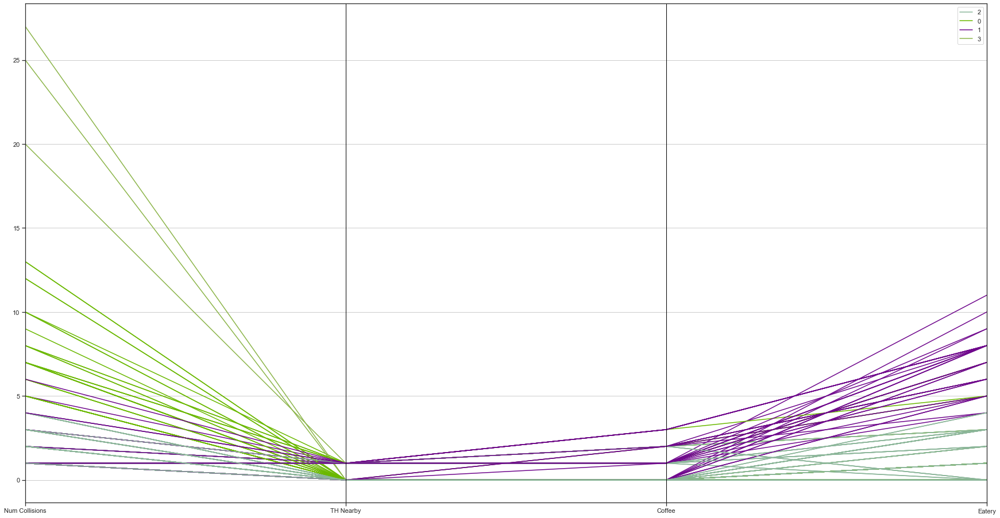

In [97]:
import pandas
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

from matplotlib.pyplot import figure
figure(figsize=(30, 16))

pd.plotting.parallel_coordinates(coll_subset_kmeans.drop(cols_to_drop_for_kmeans, axis=1), 'Cluster Label')
plt.show()

### Visualize on map with separate clusters as circles in 4 different colors, superimposed with larger dark blue circles indicating all the Tim Horton’s locations, and red markers to indicate all locations with collisions >= 8.  This map focuses on locations with high number of collisions.

In [127]:
tm_lat = 45.320859
tm_lng = -75.836647

# Map using folium and center to Ottawa's lat/lng
map_tm = folium.Map(location=[tm_lat, tm_lng], zoom_start=13)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to map

for lat, lng, num_coll, cluster in zip(coll_subset_kmeans['LATITUDE'], coll_subset_kmeans['LONGITUDE'], coll_subset_kmeans['Num Collisions'],coll_subset_kmeans['Cluster Label']): 
    label = 'Num Collisions: {}'.format(num_coll)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7,
        parse_html=False).add_to(map_tm)  
    
for lat, lng, location in zip(tm_df['Venue Latitude'], tm_df['Venue Longitude'], tm_df['GEO_ID']):
    label = 'Tim Horton at: {} at Lat/Lng: {}{}'.format(location, lat, lng)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=7,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_tm)  
        

for lat, lng, num_coll, cluster in zip(coll_subset_kmeans['LATITUDE'], coll_subset_kmeans['LONGITUDE'], coll_subset_kmeans['Num Collisions'],coll_subset_kmeans['Cluster Label']):
    label = 'Num Collisions: {}'.format(num_coll)
    label = folium.Popup(label, parse_html=True)
    if num_coll >= 8:
        folium.Marker(
          location = [lat, lng], 
          popup = label,
          icon = folium.Icon(color='red', icon='info-sign')
         ).add_to(map_tm) 
                
map_tm    
    


### In order to change perspective, I decided to create a view with a focus on the Tim Horton’s locations. This visualization shows the separate clusters as circles in 4 different colors, with black lines around the circles where the number of collisions is >= 8.  It is superimposed with red markers indicating all the Tim Horton’s locations.  

In [128]:
tm_lat = 45.320859
tm_lng = -75.836647

# Map using folium and center to Ottawa's lat/lng
map_tm = folium.Map(location=[tm_lat, tm_lng], zoom_start=13)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to map

for lat, lng, num_coll, cluster in zip(coll_subset_kmeans['LATITUDE'], coll_subset_kmeans['LONGITUDE'], coll_subset_kmeans['Num Collisions'],coll_subset_kmeans['Cluster Label']): 

    label = 'Num Collisions: {} at Lat/Lng: {},{}'.format(num_coll, lat, lng)
    label = folium.Popup(label, parse_html=True)
    if num_coll >= 8:
        marker_color = 'black'
        marker_fill_color = rainbow[cluster-1]
        marker_radius = 7
    else:
        marker_color = rainbow[cluster-1]
        marker_fill_color = rainbow[cluster-1]
        marker_radius = 3

    folium.CircleMarker(
        [lat, lng],
        radius=marker_radius,
        popup=label,
        color=marker_color,
        fill=True,
        fill_color=marker_fill_color,
        fill_opacity=0.7,
        parse_html=False).add_to(map_tm)  
    
for lat, lng, location in zip(tm_df['Venue Latitude'], tm_df['Venue Longitude'], tm_df['GEO_ID']):
    label = 'Tim Horton at: {} at Lat/Lng: {},{}'.format(location, lat, lng)
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
          location = [lat, lng], 
          popup = label,
          icon = folium.Icon(color='red', icon='info-sign')
         ).add_to(map_tm) 
                        
map_tm 

In [103]:
coll_subset_kmeans

,Cluster Label,Num Collisions,TH Nearby,Distance to TH,Distance to Ottawa,NO_OF_PEDESTRIANS,LONGITUDE,LATITUDE,Auto,Coffee,...,Liquor,Music,Nature,Nightlife,Not Known,Other,Park,Shopping,Sport or Fitness,Transportation
GEO_ID,,,,,,,,,,,,,,,,,,,,,
11,2,2,0,2.902364,13.177779,0,-75.804530,45.333936,0,0,...,0,0,0,0,0,0,0,2,0,1
148,0,7,0,2.368048,13.615368,0,-75.813137,45.334277,0,0,...,0,0,0,0,0,0,0,0,0,0
155,0,10,1,1.537144,14.489808,0,-75.819570,45.327713,0,2,...,2,0,0,0,0,2,0,5,0,0
158,2,4,1,3.713375,14.333399,0,-75.846522,45.353514,0,2,...,0,0,0,0,0,0,0,0,0,0
512,2,1,0,3.427221,13.446762,0,-75.830954,45.351410,0,0,...,0,0,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
__4LVKHQ,2,1,0,3.900312,19.333630,0,-75.846866,45.286538,0,0,...,0,0,0,0,0,0,0,0,0,0
__6KE4J1A,1,1,0,3.990502,12.139901,0,-75.809907,45.351417,0,1,...,0,0,0,0,0,2,1,2,0,0
__6KE4J1B,1,1,0,3.445979,12.635346,0,-75.812762,45.346895,0,2,...,0,0,0,0,3,2,1,10,0,1


## The 4 K-Means clusters seem to be grouped as follows:
### •	Cluster 0: Have a low range of Coffee and Eatery type of venues
### •	Cluster 1: Have a medium range of Coffee and Eatery type of venues
### •	Cluster 2: Have 0 Coffee or 0 Eatery type of venues
### •	Cluster 3: High number of collisions in the range of 20-27


In [120]:
coll_subset_kmeans.loc[coll_subset_kmeans['Cluster Label'] == 0, coll_subset_kmeans.columns[[1]+[2]+[3]+list(range(9, 11))]]


,Num Collisions,TH Nearby,Distance to TH,Coffee,Eatery
GEO_ID,,,,,
148,7,0,2.368048,0,1
155,10,1,1.537144,2,6
522,7,0,3.489865,0,0
578,5,0,2.698393,0,0
598,7,0,2.191009,0,0
1068,12,0,3.314635,0,2
2781,5,0,3.740890,0,3
3187,7,1,3.953277,2,3
3188,6,0,3.608436,0,1


In [108]:
coll_subset_kmeans.loc[coll_subset_kmeans['Cluster Label'] == 1, coll_subset_kmeans.columns[[1]+[2]+[3]+list(range(9, 11))]]


,Num Collisions,TH Nearby,Distance to TH,Coffee,Eatery
GEO_ID,,,,,
594,1,1,0.330833,1,7
639,1,0,0.885904,0,7
640,1,0,0.675401,0,9
895,1,0,1.114759,0,8
916,1,1,1.548108,2,6
1130,2,1,1.230032,2,8
5301,3,1,0.030180,1,8
5411,1,1,3.790036,3,8
9818,1,0,0.512020,0,8


In [109]:
coll_subset_kmeans.loc[coll_subset_kmeans['Cluster Label'] == 2, coll_subset_kmeans.columns[[1]+[2]+[3]+list(range(9, 11))]]


,Num Collisions,TH Nearby,Distance to TH,Coffee,Eatery
GEO_ID,,,,,
11,2,0,2.902364,0,1
158,4,1,3.713375,2,0
512,1,0,3.427221,0,2
577,4,0,2.491347,0,0
600,3,0,2.126213,0,0
...,...,...,...,...,...
__4FOEI2,1,0,0.700163,0,0
__4KCQA4,1,0,3.321575,0,1
__4LVKHQ,1,0,3.900312,0,0


In [110]:
coll_subset_kmeans.loc[coll_subset_kmeans['Cluster Label'] == 3, coll_subset_kmeans.columns[[1]+[2]+[3]+list(range(9, 11))]]


,Num Collisions,TH Nearby,Distance to TH,Coffee,Eatery
GEO_ID,,,,,
2715,20,1,3.652929,2,3
__3ZA20I,27,0,3.088318,0,0
__3ZA29B,25,0,3.094781,0,1


## 	Discussion
### Based on the two-stage approach, the analysis shows that there is a basis to support the hypothesis about venue types impacting collisions.  However, since the data in the second stage was limited, broader analysis with a larger dataset would be needed to firm up this hypothesis.  Additionally, the venue type as categorized may need to be reconsidered.  For example, it is possible that all drive-thrus may have a higher co-relation as opposed to all coffee shops or eateries in general.
### Additional analysis is recommended to explore this co-relation using a larger dataset with more specific features that are not currently available via FourSquare such as whether or not the venue has a drive-thru.


## 	Conclusion
### This analysis indicates that there is a reasonable probability that collision occurrences are impacted by nearby venues, although additional analysis is required to better understand what specific features of these venues can impact collisions.
### The results of this analysis, as well as any additional deeper analysis that may be conducted, will be useful for city planners when approving and designing roads and intersections near specific types of venues.
